# Q1

<span style='color:orange'>
Projection of a 3D point. Consider a camera with focal length of f = 480 pixels in each axis
and principal point (320, 270) pixels. Camera pose is described by the following rotation
and translation with respect to the global frame (as in Homework #1):

$$R_G^C=\begin{bmatrix} 0.5363 & −0.8440 & 0 \\ 
                       0.8440 & 0.5363 & 0
                        \\ 0 & 0 & 1 \end{bmatrix}$$
                        
$$ t^G_{C->G} = (−451.2459, 257.0322, 400) $$

The camera observes a 3D point with known coordinates in a global frame: $X^G =(350, −250, −35)^T$. 
The corresponding image observation representing this 3D point is
(241.5, 169).

</span>

In [ ]:
import numpy as np

#formating printing with numpy arrays
float_formatter = "{:.2f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

## (a)
<span style='color:orange'>
Write an expression for the camera projection matrix P . Write also numerical values
of this matrix according to the given data in this exercise.
</span>

$$ P= K[R|t] $$

The projection matrix has two parts:
The first, Extrinsic Matrix, $[R|t]$ , takes a point represented in the world coordinate system and transforms the representation that such it is in the camera coordinate system

$R  = R_G^C$ and $t = t^C_{C->G}$

The second, Intrinsic Matrix, $K$, projects the point onto the image plane


$$K=\begin{bmatrix} f & s & p_x \\ 
                       0 & f & p_y
                        \\ 0 & 0 & 1 \end{bmatrix}$$

Here was assume s = 0

In [3]:
f = 480
px = 320
py = 270
s = 0
K = np.array([
    [f, s, px],
    [0, f, py],
    [0, 0, 1]])

R_G2C = np.array([[0.5363, -0.8440, 0],
                  [0.8440, 0.5363, 0],
                  [0, 0 ,1]])
t_G_C2G = np.array([-451.2459,257.0322,400])
t_C_C2G = R_G2C@t_G_C2G


P = K @ np.hstack([R_G2C,t_C_C2G.reshape(3,1)])

print('for our system:')
print(f"P = \n{P}")

for our system:
P = 
[[257.42 -405.12 320.00 -92290.41]
 [405.12 257.42 270.00 -8642.48]
 [0.00 0.00 1.00 400.00]]


## (b)
<span style='color:orange'>

Write the underlying equations for projecting a 3D point using the projection matrix P. Calculate the image coordinates by projecting the 3D $X^G$ .

</span>

given an homogeneous point $X^G = [x, y, z, 1]^T$


$$\begin{bmatrix} \hat u \\ 
                 \hat v \\
                 \hat w \end{bmatrix} = PX$$

The point will be projected to pixels $(u,v)$ where:

$$ u = \hat u / \hat w $$
$$ v = \hat v / \hat w $$

In [4]:
X = np.array([350, -250, -35, 1])
Uz = P@X
uz = Uz[0]/Uz[2]
vz = Uz[1]/Uz[2]

print('measuerd pixel values:')
print(f'(u,v) = ({uz},{vz})')

measuerd pixel values:
(u,v) = (240.78901527232875,162.58498094465753)


## (c)
<span style='color:orange'>

Calculate the re-projection error.

</span>

The reprojection error is calculated as such:

$$ e = ||(u_z,v_z) - (u,v)||_2 $$

where the z stands is the measured pixels

In [14]:
Uz = np.array([uz,vz])
U = np.array([241.5,169])
e = np.linalg.norm(Uz-U)

print('reprojection error in pixels:')
print(e)

reprojection error in pixels:
6.454298471823932


# Q2 

<span style='color:orange'>

(a) Calibrate your own camera (any camera will do).

(b) Capture images of a calibration pattern and follow the described steps 2 to calibrate
your own camera.

(c) Submit snapshots of the process.

(d) Write an expression for the estimated camera calibration matrix K. Indicate the
principal point, and focal length in each axis.

</span>

In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

import numpy as np
#formating printing with numpy arrays
float_formatter = "{:.3f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

We decided on working with cv2 instead of Matlab </br>

references: </br>
https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html

To start the process, we took 6 images with a Samsung Galaxy A51 phone:

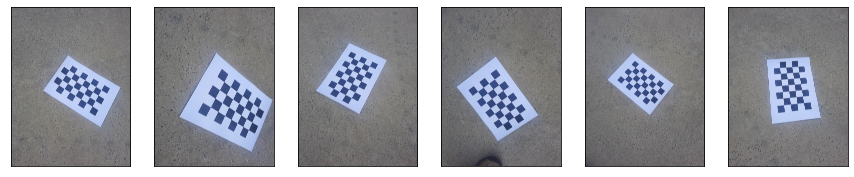

In [8]:
files = glob.glob('./images/chessboard/*.jpg')
images = np.array([cv2.cvtColor(cv2.imread(f),cv2.COLOR_BGR2RGB) for f in files])

fig, ax = plt.subplots(1, len(images),figsize=(15,15), sharex=True)
for idx in range(len(images)):
    ax[idx].imshow(images[idx])
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])

We defined the checkboard parameters

In [3]:
CHECKERBOARD = (4,7)
dx = 30 #mm

The test is best with the checkboard defined static, and the camrea is moving.
It also coorlates to the truth of events </br>
We define the world points for the checkerboard:

In [4]:
objp = np.zeros((1, CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
gridp = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
objp[0,:,:2] = gridp/dx

We found the corners of checkerboards in the images. See the faint lines on the images provided below:

In [5]:
#sub pixel optimization parameters
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
calibImages = []

for image in images:
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)
    
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        # refining pixel coordinates for given 2d points.
        corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1), criteria)
        imgpoints.append(corners2)
        calibImages.append(image)

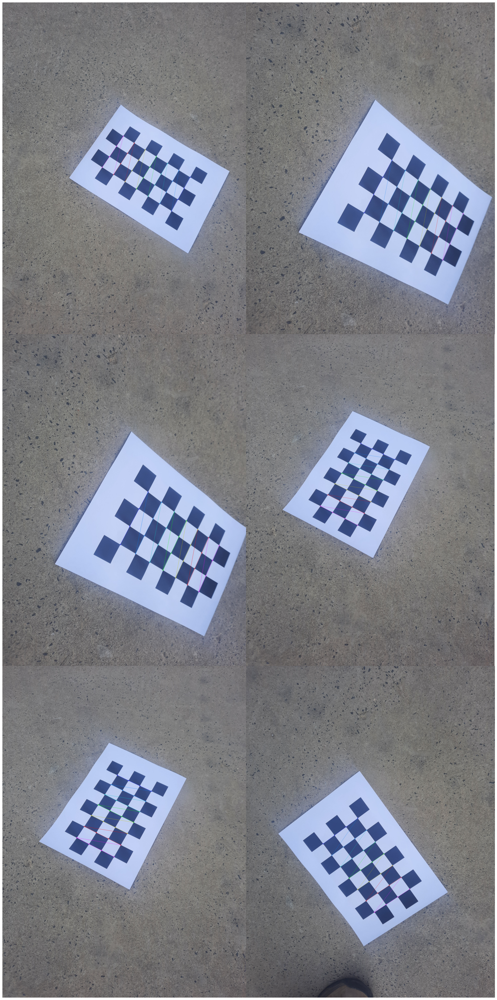

In [40]:
m = len(calibImages)//2
n = 2
fig, ax = plt.subplots(m,n,figsize=(20,40),sharex=True, sharey=True)
for ii in range(m):
    for jj in range(n):
        idx = ii*(n-1)+jj
        img = cv2.drawChessboardCorners(calibImages[idx], CHECKERBOARD, imgpoints[idx],True)
        ax[ii,jj].imshow(img)

for a in ax.ravel():
    a.set_axis_off()
fig.tight_layout(pad=0, w_pad=0, h_pad=0)

Performing camera calibration by 
passing the value of known 3D points (objpoints)
and corresponding pixel coordinates of the 
detected corners (imgpoints)

In [7]:
imageShape=images[0].shape
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imageShape[:2][::-1], None, None)


print ("Resolution:")
print(imageShape[:2][::-1])
print("Camera matrix :")
print(mtx)

Resolution:
(3000, 4000)
Camera matrix :
[[3026.994 0.000 1540.323]
 [0.000 3042.652 2028.295]
 [0.000 0.000 1.000]]


That is to say, our $K$:

$$K=\begin{bmatrix} f & s & p_x \\ 
                       0 & f & p_y
                        \\ 0 & 0 & 1 \end{bmatrix} = \begin{bmatrix} 3026.994 & 0 & 1540.323 \\ 
                                                                    0 & 3042.652 & 2028.295
                                                                    \\ 0 & 0 & 1 \end{bmatrix}$$

Sanity check: </br>

Principle points are approx $1/2$ of the resolution, which makes sense </br>

Focal lengths are such that an object 1 meter long, standing 1 meter away, will take up most of the picture. sounds right


# Q3

<span style='color:orange'>


In this exercise we will perform basic image feature extraction and matching. You are
free to choose what implementation and programming language to use - one recommended
alternative for the latter is the vlfeat library 3 , which provides also interface to Matlab and
useful tutorials.

</span>

In [ ]:
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from PIL import Image, ImageEnhance
from scipy.spatial.distance import cdist
%matplotlib inline

import numpy as np
#formating printing with numpy arrays
float_formatter = "{:.3f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

## (a)

<span style='color:orange'>
Use a camera to capture 2 images of yourself from relatively close viewpoints (not
more than 30 degrees change in yaw angle) </br>
</span>

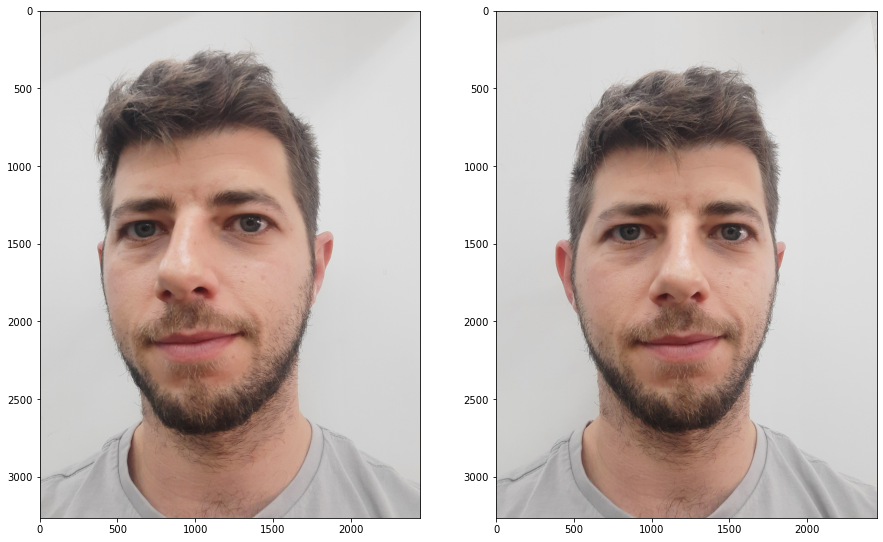

In [2]:
files = glob.glob('./images/sift/*.jpg')
images = np.array([cv2.cvtColor(cv2.imread(f),cv2.COLOR_BGR2RGB) for f in files])
szImages = [cv2.resize(image.copy(),None,fx=1,fy=1) for image in images]

fig, ax = plt.subplots(1, len(szImages),figsize=(15,15))
for idx,image in enumerate(szImages):
    ax[idx].imshow(image)

## (b)

<span style='color:orange'>
Extract SIFT features in each image.</br>
Please attach the two images with the extracted features. Indicate feature scale and
orientation for a representative feature.</br>
</span>

In [3]:
grayImages = [cv2.cvtColor(image.copy(), cv2.COLOR_BGR2GRAY) for image in szImages]
sift = cv2.SIFT_create()

kpsList = []
descsList = []
for gray in grayImages:
    kps, descs = (sift.detectAndCompute(gray,None))
    kpsList.append(kps)
    descsList.append(descs)

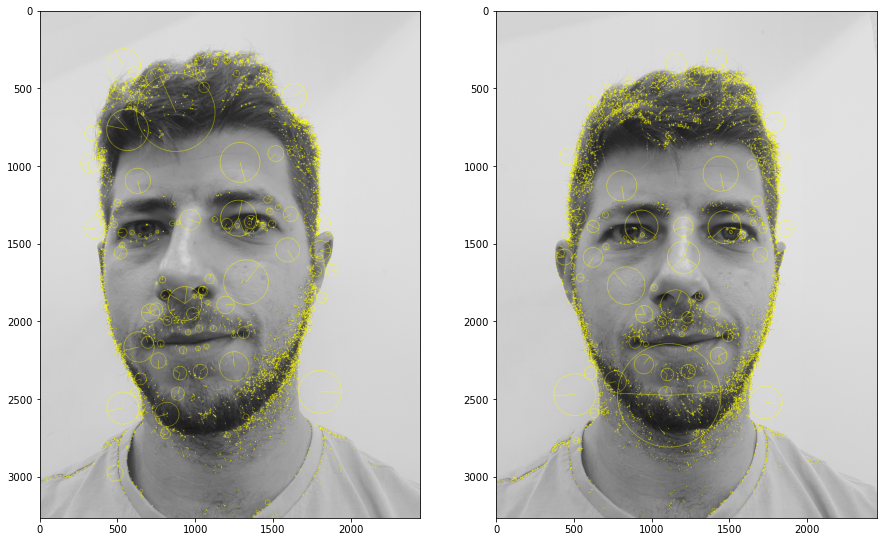

In [4]:
fig, ax = plt.subplots(1, len(images),figsize=(15,15))
for idx,(image,gray,kps) in enumerate(zip(szImages,grayImages,kpsList)):
    img = cv2.drawKeypoints(gray, kps, outImage=np.array([]), color=(255, 255, 0),
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img = Image.fromarray(img)
    filter = ImageEnhance.Color(img)
    img = filter.enhance(10)
    ax[idx].imshow(img)

## (c)

<span style='color:orange'>
Calculate putative matches by matching SIFT descriptors as explained in class.
Please show, on a separate figure, the calculated matches between the two images.
Among these matches, indicate representative inlier and outlier matches.
</span>

**It is important to note that we do not have inliers and outliers in this problem as we do not have a mathematical model to fit!** </br>
What we do have, is a way to determine a good match from a bad one. </br>
We decided that a good match is one that is reciprocal (both side's minimal distance to neighbor points to each other), and a bad match is one that isn't
A worst match is where both side's maximal distance to neighbor points to each other.

In [5]:
# Some helping functions
def findMatches(desc1,desc2):
    #desc1,desc2 - mxn numpy array matrix, m - amount of features, n - descriptor length
    #returns matches, nx2 numpy array matrix containing indcies of good matches.
                    #first column correlates to desc1, and second to desc2
    
    #brute force, crossheck

    # Will be equivalent to, but returns numpy array instead of wierd objects:
    # bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    # matches = bf.match(descs[0],descs[1])
    # matches = sorted(matches, key = lambda x:x.distance)

    matches = []

    D = cdist(np.float32(desc1), np.float32(desc2), metric='euclidean') #create a matrix of mxn with distance values
    m,n = D.shape

    minIdx0 = np.argmin(D, axis=0) #returns array of length n, argmin of each column
    minIdx1 = np.argmin(D, axis=1) #returns array of length m, argmin of each row
    
    for ii in range(m):
        for jj in range(n):
            if ii == minIdx0[jj] and jj == minIdx1[ii]:
                matches.append([ii,jj])
    
    return np.array(matches)
def findBadMatches(desc1,desc2):
    #desc1,desc2 - mxn numpy array matrix, m - amount of features, n - descriptor length
    #returns badMatches, nx2 numpy array matrix containing indcies of good matches.
                    #first column correlates to desc1, and second to desc2
    
    #brute force, crossheck - these matches are the absolute worst, agreed from both sides

    badMatches = []

    D = cdist(np.float32(desc1), np.float32(desc2), metric='euclidean') #create a matrix of mxn with distance values
    m,n = D.shape

    maxIdx0 = np.argmax(D, axis=0) #returns array of length n, argmax of each column
    maxIdx1 = np.argmax(D, axis=1) #returns array of length m, argmax of each row
    
    for ii in range(m):
        for jj in range(n):
            if ii == maxIdx0[jj] and jj == maxIdx1[ii]:
                badMatches.append([ii,jj])
    
    return np.array(badMatches)
def plotMatches(im1, im2, matches, locs1, locs2, colormap ,title):
    #im1,im2 - gray images
    #matches - nx2 numpy array matrix containing indcies of good matches.
                    #first column correlates to desc1, and second to desc2
    #locs1,locs2 - 2xn numpy array containing location of features
    #title - string

    fig, ax = plt.subplots(figsize=(20,8))
    fig.suptitle(title,fontsize=40)
    
    # draw two images side by side
    imH = max(im1.shape[0], im2.shape[0])
    im = np.zeros((imH, im1.shape[1]+im2.shape[1]), dtype='uint8')
    im[0:im1.shape[0], 0:im1.shape[1]] = im1
    im[0:im2.shape[0], im1.shape[1]:] = im2
    ax.imshow(im, cmap='gray')
    
    colors = colormap(np.linspace(0, 1, matches.shape[0]))

    for i, c in zip(range(matches.shape[0]), colors):
        pt1 = locs1[matches[i,0], 0:2]
        pt2 = locs2[matches[i,1], 0:2].copy()
        pt2[0] += im1.shape[1]
        x = np.asarray([pt1[0], pt2[0]])
        y = np.asarray([pt1[1], pt2[1]])

        ax.plot(x,y,color=c,linewidth = 0.5)
        ax.scatter(x,y,color=c)
def kp2locs(kps):
    locs = []
    for kp in kps:
        locs.append(kp.pt)
    return np.array(locs)

In [6]:
#reformat data for our needs
locs0 = kp2locs(kpsList[0])
locs1 = kp2locs(kpsList[1])

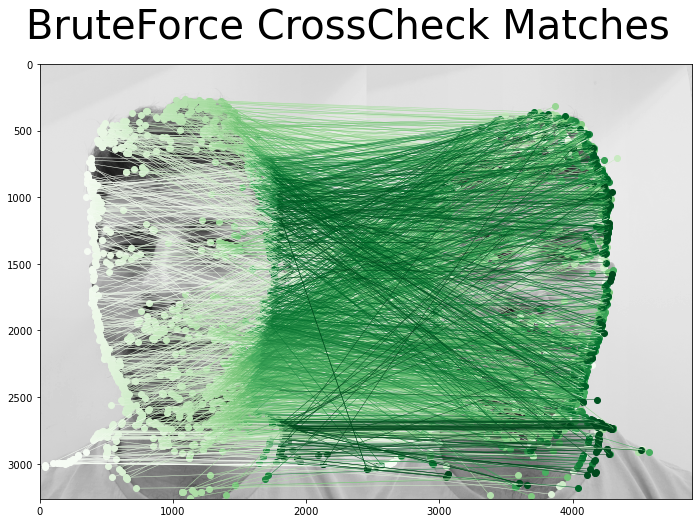

In [7]:
#good matches
matches = findMatches(descsList[0],descsList[1])
plotMatches(grayImages[0], grayImages[1], matches, locs0, locs1, matplotlib.cm.Greens,'BruteForce CrossCheck Matches')

Nice! note how feature of each side of the face match correctly

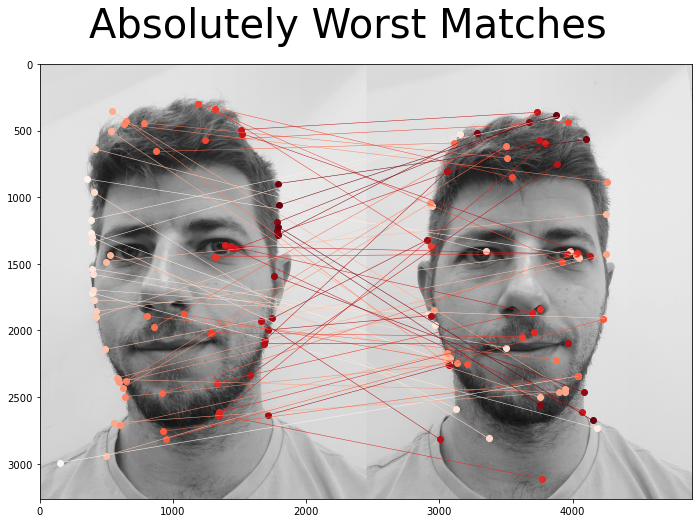

In [8]:
#bad matches
badMatches = findBadMatches(descsList[0],descsList[1])
plotMatches(grayImages[0], grayImages[1], badMatches, locs0, locs1, matplotlib.cm.Reds,'Absolutely Worst Matches')